<h1 style = "text-align:center">
Vector Search
</h1>

<p>
This Jupyter Notebook showcases how to vectorize documents,
    how to visualize the vectorized documents.
</p>
<p><b>
    Our Goal:
    </b></p>
<ul>
    <li>
        (Motivation) Navigate through the island of documents until the user query
        <ol>
    <li> Visualise Semantic Information in a 3D plot. </li>
    <li> Visualise Query and documents in a 3D plot</li>
    </ol>
    </li>
    <li>Vector Search don't solve the data cleaning</li>
    <li>Accuracy vs Latency...choose your model wisely (cover: out-of-the box models, but we do not cover fine-tuning models)</li>
    <li>Vector Search 101</li>
    <li>Show me a Vector Database (Qdrant)</li>
    </ul>

![VectorSearch](vector_search.png) 

<h1 style = "text-align:center">
Parlament Data
</h1>

<ul>
<li> Documents are in Italian, French and German. </li>
<li> Almost 70k Documents. </li>
</ul>

<p>
Our Vector Search Solution:
</p>

![OurVectorSerchSolution](one-fits-all-vector-search.png) 

<p>
Other possibilities:
</p>

![MultiIndexVectorSerchSolution](multi-index-vector-search.png) 

In [1]:
import numpy as np
import pandas as pd

In [2]:
from sentence_transformers import SentenceTransformer, util

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [15]:
from vsearch.preprocessing.text_normalization import TextNormalization
from vsearch.nlp.transformers import documents_to_vector

In [16]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [764]:
import torch

In [765]:
from qdrant_client.http.models import NamedVector
from qdrant_client import QdrantClient
from qdrant_client.models import VectorParams, Distance
from qdrant_client.http import models

In [17]:
import time

In [23]:
palette_language = {'DE': 'red', 'FR': 'blue', 'IT': 'green', 'RM': 'yellow', 'EN': 'black'}


In [411]:
business_data = pd.read_csv('input/PD_Business_Data_tags.csv',
                            encoding='latin1',
                            nrows = 156718)

In [412]:
business_data = business_data.loc[ (~ business_data.SubmittedText.isna())]

In [413]:
business_data = business_data.loc[  business_data.Language.isin(['DE', 'FR', 'IT']) ]

In [518]:
# Not relevant for vector search, only for vizualisation purposes
business_data['Id'] = range(business_data.shape[0])

In [519]:
business_data.shape

(69758, 12)

In [415]:
business_data.head(2)

,ID,Language,SubmittedText,TagNames
15,19850227,DE,<text><p>Anknüpfend an meine 1973 überwiesene ...,NaN
17,19850227,FR,<text><p>À la suite de la motion visant une me...,NaN


In [416]:
business_data.SubmittedText.iloc[0]

'<text><p>Anknüpfend an meine 1973 überwiesene Motion für bessere Koordination im Sozialversicherungsrecht beantrage ich gemäss Artikel\xa021sexies des Geschäftsverkehrsgesetzes auf dem Weg der Parlamentarischen Initiative als allgemeine Anregung, es sei ein Bundesgesetz über einen Allgemeinen Teil des Sozialversicherungsrechtes zu erlassen auf der Grundlage des ausgearbeiteten Entwurfes, den die Schweizerische Gesellschaft für Versicherungsrecht gemäss kürzlichen Presseberichten im Januar 1985 dem EDI einreichte und vorstellte.</p></text>'

In [417]:
normalize_text = TextNormalization(business_data,
                              'SubmittedText')

In [418]:
normalize_text.lower_text()

In [419]:
normalize_text.remove_html_tags()

In [420]:
normalize_text.translate_unicode_to_ascii()

In [421]:
business_data.SubmittedText.iloc[0]

'anknupfend an meine 1973 uberwiesene motion fur bessere koordination im sozialversicherungsrecht beantrage ich gemass artikel 21sexies des geschaftsverkehrsgesetzes auf dem weg der parlamentarischen initiative als allgemeine anregung, es sei ein bundesgesetz uber einen allgemeinen teil des sozialversicherungsrechtes zu erlassen auf der grundlage des ausgearbeiteten entwurfes, den die schweizerische gesellschaft fur versicherungsrecht gemass kurzlichen presseberichten im januar 1985 dem edi einreichte und vorstellte.'

<h1 style = "text-align:center">
Vectorize Documents
</h1>
<p>
    <b>How can we vectorise documents?</b>
    </p>
<ul>
    <li>Use sentence transformers.</li>
    <li>A good starting point is Hugging Face.</li>
    <li>Other options not covered here: word2vec, fasttext, Glove.</li>
</ul>
<p><b>Useful Links:</b></p>
<ul>
    <li>https://www.sbert.net </li>
    <li>https://huggingface.co/sentence-transformers</li>
    <li>https://www.sbert.net/examples/applications/semantic-search/README.html</li>
    <li>https://medium.com/mlearning-ai/semantic-search-with-s-bert-is-all-you-need-951bc710e160</li>
</ul>

![EmbeddingLatency](vector-search-latency.png) 

<ul>
<li>We vectorize the documnets using two different models.</li>
<li>The first model all-mpnet-base-v2  documents are embedded in a 768 vector space.</li>
<li>The first model paraphrase-MiniLM-L3-v2  documents are embedded in a 368 vector space.</li>
</ul>

In [423]:
max_seq_length = 250

sentence_model1 = 'all-mpnet-base-v2'
sentence_model2 = 'paraphrase-MiniLM-L3-v2'

In [755]:
model1 = SentenceTransformer(sentence_model1)
model2 = SentenceTransformer(sentence_model2)
#print(model1[0].auto_model.config.max_position_embeddings)
#print(model2[0].auto_model.config.max_position_embeddings)

In [463]:
# Our aim is to vectorize  SubmittedText
documents = business_data.reset_index().SubmittedText

In [464]:
start_time = time.time()
document_embedding1 = documents_to_vector(documents,
                   sentence_model1,
                   max_seq_length =  max_seq_length)

end_time = time.time()
elapsed_time = end_time - start_time

Batches:   0%|          | 0/2180 [00:00<?, ?it/s]

In [466]:
print(f"Model {sentence_model1}")
print(f"Time taken: {elapsed_time} seconds")
print(f"Time taken: {elapsed_time/60} Minutes")

Model all-mpnet-base-v2
Time taken: 27474.377309799194 seconds
Time taken: 457.90628849665325 Minutes


In [515]:
#np.save('output/deepdive_'+sentence_model1+'.npy', sentence_model1)

In [427]:
start_time = time.time()
document_embedding2 = documents_to_vector(documents,
                   sentence_model2,
                   max_seq_length =  max_seq_length)

end_time = time.time()
elapsed_time = end_time - start_time

Batches:   0%|          | 0/2180 [00:00<?, ?it/s]

In [430]:
print(f"Model {sentence_model2}")
print(f"Time taken: {elapsed_time} seconds")
print(f"Time taken: {elapsed_time/60} Minutes")

Model paraphrase-MiniLM-L3-v2
Time taken: 4249.755421876907 seconds
Time taken: 70.82925703128178 Minutes


In [516]:
#np.save('output/deepdive_'+sentence_model2+'.npy', sentence_model2)

<p><b> Higher-dimensional embeddings:</b> </p>
<ul>
    <li>(+) can capture more complex relationships between words</li> 
    <li>(+) can encode more semantic information</li>
    <li>(-) are computationally less efficient</li>
    <li>(-) require more memory</li>
    </ul>


In [757]:
print(f"Model: {sentence_model1}.  Number of vector and dimension: {document_embedding1.shape}")
print(f"Model: {sentence_model2}.  Number of vector and dimension: {document_embedding2.shape}")

Model: all-mpnet-base-v2.  Number of vector and dimension: (69758, 768)
Model: paraphrase-MiniLM-L3-v2.  Number of vector and dimension: (69758, 384)


<h1 style = "text-align:center">
Visualize Vectors
</h1>

In [467]:
pca = PCA(n_components=3)
pca_results = pca.fit_transform(document_embedding1)

In [468]:
business_data['Dimension 1'] =  pca_results[:,0]
business_data['Dimension 2'] =  pca_results[:,1]
business_data['Dimension 3'] =  pca_results[:,2]
business_data['SimplifySubmittedText'] = business_data['SubmittedText'].str[0:50]

In [470]:
pca2 = PCA(n_components=3)
pca_results2 = pca2.fit_transform(document_embedding2)

In [471]:
business_data['Dimension 1 2'] =  pca_results2[:,0]
business_data['Dimension 2 2'] =  pca_results2[:,1]
business_data['Dimension 3 2'] =  pca_results2[:,2]


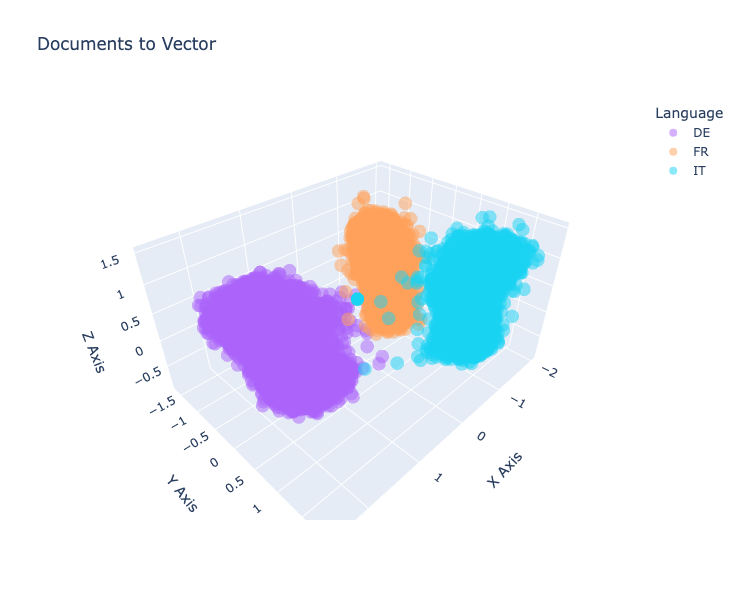

<Figure size 1500x1500 with 0 Axes>

In [538]:
plt.figure(figsize=(15, 15))
fig = px.scatter_3d(data_frame = business_data,
                    x = 'Dimension 1 2',
                    y = 'Dimension 2 2',
                    z = 'Dimension 3 2',
                    opacity = 0.5,
                    color = 'Language',
                    color_discrete_map = palette_language,
                    hover_data = ['Id'],
                    title='Documents to Vector')
fig.update_layout(scene=dict(xaxis_title='X Axis',
                             yaxis_title='Y Axis',
                             zaxis_title='Z Axis'),
                  width = 600,
                  height = 600)
fig.show()

In [548]:
business_data.loc[  business_data['Id'].isin([8619, 43032, 65425])][['Id','SubmittedText', 'Language']]

,Id,SubmittedText,Language
25743,8619,98.3604interpellation pellirechtshilfe in stra...,IT
104813,43032,il tiro federale in campagna di quest'anno e a...,IT
148513,65425,,IT


In [550]:
business_data.loc[  business_data['Id'].isin([8619])].SubmittedText.iloc[0]

'98.3604interpellation pellirechtshilfe in strafsachen.standortdes zukunftigen buros "italien"interpellanza pellicollocazione del futuro ufficiocentrale per l\'assistenza giudiziariain materia penale relativa all\'italiainterpellation pellientraide judiciaire en matiere penale.emplacementdu futur "office central italie"wortlaut der interpellation vom 16. dezember 1998der vertrag zwischen der schweiz und italien zur erganzung des europaischen ubereinkommens vom 20. april 1959 uber die rechtshilfe in strafsachen und zur erleichterung seiner anwendung, der am 10. september 1998 von bundesrat arnold koller unterzeichnet und am 14. dezember 1998 vom bundesrat ratifiziert worden ist, sieht in artikel xviii die schaffung einer besonderen zentralstelle im bundesamt fur polizeiwesen des eidgenossischen justiz- und polizeidepartementes vor.unabhangig von der frage, ob ein solcher - stellenweise problematischer - vertrag durch das parlament ratifiziert werden soll, und angesichts der im zusammenh

In [474]:
top_tagname_palette = {'Gesundheit': 'red', 'Santé': 'red', 'Transports': 'green', 'Verkehr': 'green', 'Other': '#e9e9e9'}


In [475]:
business_data_de =business_data.loc[ business_data['Language'] == 'DE']

In [760]:
def topn_tagnames(x):
    if x in TopNTagNames:
        return x
    else:
        return 'Other'    
    
#TopNTagNames
business_data_de.loc[::,'TopNTagNames'] = [ topn_tagnames(x) for x in business_data_de.TagNames ]

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<h1 style = "text-align:center">
Vector Search
</h1>

In [729]:
query = "inflation und lohn bekampfen" # covid

In [730]:
# vectorize Query
query_vector = model2.encode(query)

In [731]:
# Find the closest documents to the Query
# Measure distance: Cosine Distance
document_scores = util.cos_sim(query_vector, document_embedding2)[0]

In [732]:
k = 10
top_results = torch.topk(document_scores,
                         k= k)

top_results = top_results[1].tolist()

In [733]:
for i in top_results:
    print(business_data.iloc[i].SubmittedText)
    print('.............................................................')

wahrend andere staaten die mehrwertsteuer aufgrund der aktuellen volkswirtschaftlichen lage senken wollen, soll sie in der schweiz - befristet - erhoht werden. dabei stellen sich folgende fragen:1. heizt eine mehrwertsteuererhohung die rekordteuerung nicht weiter an?2. welche konjunkturpolitischen massnahmen trifft der bundesrat, um der zu erwartenden inflation (durch faktoren wie finanzkrise, olpreis, mehrwertsteuererhohung, strompreis usw.) entgegenzuwirken?
.............................................................
aufkeimende inflationsangste und eine trendwende bei den aktienkursen haben umgekehrt die kurse von langerfristigen anleihen/obligationen fallen lassen. diese entwicklung kann sich im falle einer wirtschaftlichen erholung, verbunden mit einer vorubergehend hoheren inflation, noch wesentlich verstarken. die folge ist, dass die portefeuilles jener investoren, die angesichts der krise ihren aktienanteil stark reduziert oder die grundsatzlich aus sicherheitsuberlegungen vo

<h1 style = "text-align:center">
Qdrant Example
</h1>

In [766]:
qdrant_client = QdrantClient(url='https://79d372b2-67b4-44a9-872e-23e9b5e46646.us-east4-0.gcp.cloud.qdrant.io',
                        api_key = 'aCswfzqt4ytlnpgLrDh5hMGqMZAALoYnBrsNUbELNpfe7T2zIsgt-w')

In [788]:
def get_search_results(query = 'krankekasse',
                       query_model = 'all-mpnet-base-v2',
                       language_filter = 'DE',
                      number_of_results = 5,
                      max_seq_length = 250):  
    
    # vectorize text
    
    transformer_model = SentenceTransformer(query_model)
    transformer_model.max_seq_length = max_seq_length
    query_vector = transformer_model.encode(query).tolist()
    
    search_results = qdrant_client.search(
        collection_name = 'parlament_bern',
        query_vector = NamedVector(
            name = query_model,
            vector =  query_vector   ),
        query_filter =  models.Filter(
            must = [
                models.FieldCondition(
                    key = "Language",
                    match = models.MatchValue(
                        value = language_filter) )
            ]
        ),
        search_params=models.SearchParams(hnsw_ef=128, exact=False),
    limit = number_of_results)

    return search_results

In [ ]:
# Vector Search parameters 
k = 1
query_model= ['all-mpnet-base-v2', 'paraphrase-MiniLM-L3-v2']
query_qdrant = 'inflation lohn '
language_filter = 'DE'

In [833]:
start_time = time.time()
search_results = get_search_results(query = query_qdrant,
                                    query_model = query_model[k],
                                    language_filter= language_filter
                                   )
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken: {elapsed_time} seconds")

Time taken: 0.6246609687805176 seconds


<h2 style = "text-align:center">
Show Search results
</h2>

In [834]:
text_results = []
number_results = len(search_results)
for i in range(number_results):
    text_results.append( list(search_results[i])[3][1]['SubmittedText'] )

In [835]:
text_results[0]

'<p>Der Bundesrat wird aufgefordert, dem Parlament ein Massnahmenpaket vorzulegen, das Eltern in mittleren und unteren Einkommensklassen wirtschaftlich deutlich stärkt.</p>'

In [836]:
text_results[1]

'<p>Der Bundesrat soll sich dafür stark machen, dass die Notenbank ihre Devisenreserven vom Dollar in den Euro umschichtet und so massive Kursverluste infolge der Dollarschwäche verhindert.</p>'

In [837]:
text_results[2]

'<p>Im Kanton Thurgau konnte sich kürzlich ein Rekrut, der in alkoholisiertem und bekifftem Zustand mit einem Militärfahrzeug einen Unfall verursacht hat, dadurch der angeordneten Untersuchung entziehen, dass er kurzfristig ein Gesuch um Umteilung in den Zivildienst stellte.</p><p>Was unternimmt das Eidgenössische Volkswirtschaftsdepartement, um die ordnungsgemässe Untersuchung zum mutmasslich Tatsache gewordenen rechtswidrigen Verhalten zu gewährleisten?</p>'